# Using NERF models to embed 3D objects in reconstructed scenarios

## Step 0: Set up environment


Necessary NERF functions

In [ ]:
!git clone https://github.com/ActiveVisionLab/nerfmm.git

Cloning into 'nerfmm'...
remote: Enumerating objects: 97, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 97 (delta 0), reused 0 (delta 0), pack-reused 94
Unpacking objects: 100% (97/97), 82.80 MiB | 10.27 MiB/s, done.


Get prepared example data

In [ ]:
# get prepared example scenes
!wget https://www.robots.ox.ac.uk/~ryan/nerfmm2021/nerfmm_colab_data.tar.gz

# extract and clean storage
!tar xzf nerfmm_colab_data.tar.gz
!rm nerfmm_colab_data.tar.gz

--2023-06-12 15:35:43--  https://www.robots.ox.ac.uk/~ryan/nerfmm2021/nerfmm_colab_data.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25803698 (25M) [application/x-gzip]
Saving to: ‘nerfmm_colab_data.tar.gz’

nerfmm_colab_data.t 100%[===================>]  24.61M  6.23MB/s    in 4.0s    

2023-06-12 15:35:49 (6.23 MB/s) - ‘nerfmm_colab_data.tar.gz’ saved [25803698/25803698]



Import packages and functions

In [ ]:
import os, random, datetime
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import imageio
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from IPython.display import Image
from google.colab import files


Set random seeds for the entire session.

In [ ]:
random.seed(17)
np.random.seed(17)
torch.manual_seed(17)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

Import general NeRF-related functions, including:

- positional encoding
- volume sampling
- volume rendering
- ray direction computing

These functions are useful to general NeRF training, but are not of interest in this notebook so we omit these details. More details can be found in our [git repo](https://https://github.com/ActiveVisionLab/nerfmm).


In [ ]:
from nerfmm.utils.pos_enc import encode_position
from nerfmm.utils.volume_op import volume_rendering, volume_sampling_ndc
from nerfmm.utils.comp_ray_dir import comp_ray_dir_cam_fxfy

# utlities
from nerfmm.utils.training_utils import mse2psnr
from nerfmm.utils.lie_group_helper import convert3x4_4x4

## Step 1a: Select scenes

### Opt A: try our prepared images
We provide 3 prepared scenes, including
- two scenes from [NeRF-LLFF dataset](https://drive.google.com/drive/folders/128yBriW1IG_3NJ5Rp7APSTZsJqdJdfc1) but in lower resolution: *llff_leaves* and *llff_flower*;
- a scene captured by us: *desk*.

Set the `scene_name` to (`'llff_leaves'`/`'llff_flower'`/`'desk'`) to use our prepared data.

### Opt B: try your images
You can also try your images by setting the `scene_name` to `'upload'` and an upload button will appear to allow you upload your images. The full procedures are as follows:
1. Take about 20-60 **foward-facing** images in [LLFF fashion](https://github.com/Fyusion/LLFF/blob/master/imgs/capture.gif).
2. Resize them to smaller resolusion so that `max(H, W) < 1000`. On linux, you can use command `mogrify` to resize all images in a folder:
```bash
mogrify -resize 25% ./images/*
```
You might need to adjust the `25%` according to your original image size. Overall we just want to ease the burden on colab.
3. Zip the image folder and upload the `.zip` file. Make sure the image folder you compressed contains images only, and the images are stored in common image types such as jpg or png. For example, if you have images in a folder `images`:
```
images/
    |--0000.png
    |--0001.png
    |--0002.png
  ...
```
you can just run `zip -r images.zip ./images` and upload the `images.zip` using the upload entry below.

In [ ]:
scene_name = input('Pick a scene: (llff_flower / llff_leaves / desk / upload) ')
print('Selected scene: ', scene_name)
if scene_name in ['llff_flower', 'llff_leaves', 'desk']:
    image_dir = os.path.join('nerfmm_colab_data', scene_name)
elif scene_name == 'upload':
    try:
        !rm -rf 'custom_upload'

        uploaded = files.upload()
        up_file_name = list(uploaded.keys())[0]
        print('Uploaded file "{name}" with size ~{length} MB'.format(name=up_file_name, length=len(uploaded[up_file_name])/1e6))

        !mv $up_file_name 'custom_upload.zip'
        !unzip 'custom_upload.zip' -d 'custom_upload'
        !rm 'custom_upload.zip'
        image_dir = os.path.join('custom_upload', os.listdir('custom_upload')[0])
        print('Upload and unzip done.')
    except:
        print('Seems like upload failed. Please retry.')
else:
    scene_name = 'llff_flower'
    image_dir = os.path.join('nerfmm_colab_data', scene_name)
    print('Unknown scene name. Using llff_flower scene.')


Pick a scene: (llff_flower / llff_leaves / desk / upload) upload
Selected scene:  upload


Saving images_resize.zip to images_resize.zip
Uploaded file "images_resize.zip" with size ~3.326879 MB
Archive:  custom_upload.zip
  inflating: custom_upload/images_resize/20230612_092907_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092909_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092910_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092912_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092913_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092915_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092916_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092918_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092920_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092921_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092922_652x367.jpg  
  inflating: custom_upload/images_resize/20230612_092924_652x367.jpg  
  inflating: cust

## Step 1b: Load images

<ipython-input-18-2e55a974cf6d>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(p)[:, :, :3]  # (H, W, 3) np.uint8


Loaded 48 imgs, resolution 367 x 652
torch.Size([48, 367, 652, 3])


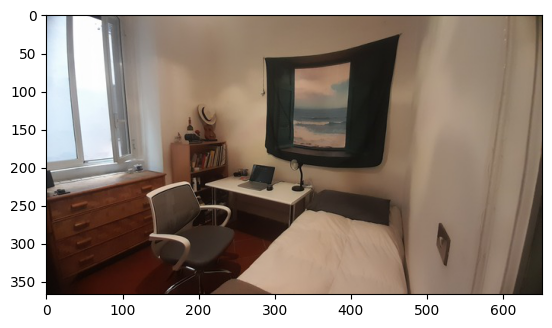

In [ ]:
def load_imgs(image_dir):
    img_names = np.array(sorted(os.listdir(image_dir)))  # all image names
    img_paths = [os.path.join(image_dir, n) for n in img_names]
    N_imgs = len(img_paths)

    img_list = []
    for p in img_paths:
        img = imageio.imread(p)[:, :, :3]  # (H, W, 3) np.uint8
        img_list.append(img)
    img_list = np.stack(img_list)  # (N, H, W, 3)
    img_list = torch.from_numpy(img_list).float() / 255  # (N, H, W, 3) torch.float32
    H, W = img_list.shape[1], img_list.shape[2]

    results = {
        'imgs': img_list,  # (N, H, W, 3) torch.float32
        'img_names': img_names,  # (N, )
        'N_imgs': N_imgs,
        'H': H,
        'W': W,
    }
    return results

image_data = load_imgs(image_dir)
imgs = image_data['imgs']  # (N, H, W, 3) torch.float32

N_IMGS = image_data['N_imgs']
H = image_data['H']
W = image_data['W']

print('Loaded {0} imgs, resolution {1} x {2}'.format(N_IMGS, H, W))
print(imgs.shape)
plt.imshow(imgs[0])

## Step 2a: Define learnable FOCALS

We initialise $f_x = W$ and $f_y = H$.

In practice, two coeffcients are initialised at $1.0$ and multiplied with the input image size. We also found a $2^{nd}$-order trick provides slightly better results, but it's not necessary. For more details about the $2^{nd}$-order trick, see the supplementary section in our [arxiv paper](https://https://arxiv.org/abs/2102.07064).

In [ ]:
class LearnFocal(nn.Module):
    def __init__(self, H, W, req_grad):
        super(LearnFocal, self).__init__()
        self.H = H
        self.W = W
        self.fx = nn.Parameter(torch.tensor(1.0, dtype=torch.float32), requires_grad=req_grad)  # (1, )
        self.fy = nn.Parameter(torch.tensor(1.0, dtype=torch.float32), requires_grad=req_grad)  # (1, )

    def forward(self):
        # order = 2, check our supplementary.
        fxfy = torch.stack([self.fx**2 * self.W, self.fy**2 * self.H])
        return fxfy

## Step 2b: Define learnable POSES

Given $N$ input images, we learn a camera pose for each of them. Camera rotations are optimised in axis-angle representation and translations are optimised in Euclidean space.

In [ ]:
def vec2skew(v):
    """
    :param v:  (3, ) torch tensor
    :return:   (3, 3)
    """
    zero = torch.zeros(1, dtype=torch.float32, device=v.device)
    skew_v0 = torch.cat([ zero,    -v[2:3],   v[1:2]])  # (3, 1)
    skew_v1 = torch.cat([ v[2:3],   zero,    -v[0:1]])
    skew_v2 = torch.cat([-v[1:2],   v[0:1],   zero])
    skew_v = torch.stack([skew_v0, skew_v1, skew_v2], dim=0)  # (3, 3)
    return skew_v  # (3, 3)


def Exp(r):
    """so(3) vector to SO(3) matrix
    :param r: (3, ) axis-angle, torch tensor
    :return:  (3, 3)
    """
    skew_r = vec2skew(r)  # (3, 3)
    norm_r = r.norm() + 1e-15
    eye = torch.eye(3, dtype=torch.float32, device=r.device)
    R = eye + (torch.sin(norm_r) / norm_r) * skew_r + ((1 - torch.cos(norm_r)) / norm_r**2) * (skew_r @ skew_r)
    return R


def make_c2w(r, t):
    """
    :param r:  (3, ) axis-angle             torch tensor
    :param t:  (3, ) translation vector     torch tensor
    :return:   (4, 4)
    """
    R = Exp(r)  # (3, 3)
    c2w = torch.cat([R, t.unsqueeze(1)], dim=1)  # (3, 4)
    c2w = convert3x4_4x4(c2w)  # (4, 4)
    return c2w


class LearnPose(nn.Module):
    def __init__(self, num_cams, learn_R, learn_t):
        super(LearnPose, self).__init__()
        self.num_cams = num_cams
        self.r = nn.Parameter(torch.zeros(size=(num_cams, 3), dtype=torch.float32), requires_grad=learn_R)  # (N, 3)
        self.t = nn.Parameter(torch.zeros(size=(num_cams, 3), dtype=torch.float32), requires_grad=learn_t)  # (N, 3)

    def forward(self, cam_id):
        r = self.r[cam_id]  # (3, ) axis-angle
        t = self.t[cam_id]  # (3, )
        c2w = make_c2w(r, t)  # (4, 4)
        return c2w

## Step 2c: Define a tiny NeRF
We define a tiny NeRF for faster colab training, with following modifications:
- We use 4 linear layers (official NeRF has 8) before the RGB and density fully connect layers.
- We discard the shortcut since the tiny NeRF is quite shallow now.

In [ ]:
class TinyNerf(nn.Module):
    def __init__(self, pos_in_dims, dir_in_dims, D):
        """
        :param pos_in_dims: scalar, number of channels of encoded positions
        :param dir_in_dims: scalar, number of channels of encoded directions
        :param D:           scalar, number of hidden dimensions
        """
        super(TinyNerf, self).__init__()

        self.pos_in_dims = pos_in_dims
        self.dir_in_dims = dir_in_dims

        self.layers0 = nn.Sequential(
            nn.Linear(pos_in_dims, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
        )

        self.fc_density = nn.Linear(D, 1)
        self.fc_feature = nn.Linear(D, D)
        self.rgb_layers = nn.Sequential(nn.Linear(D + dir_in_dims, D//2), nn.ReLU())
        self.fc_rgb = nn.Linear(D//2, 3)

        self.fc_density.bias.data = torch.tensor([0.1]).float()
        self.fc_rgb.bias.data = torch.tensor([0.02, 0.02, 0.02]).float()

    def forward(self, pos_enc, dir_enc):
        """
        :param pos_enc: (H, W, N_sample, pos_in_dims) encoded positions
        :param dir_enc: (H, W, N_sample, dir_in_dims) encoded directions
        :return: rgb_density (H, W, N_sample, 4)
        """
        x = self.layers0(pos_enc)  # (H, W, N_sample, D)
        density = self.fc_density(x)  # (H, W, N_sample, 1)

        feat = self.fc_feature(x)  # (H, W, N_sample, D)
        x = torch.cat([feat, dir_enc], dim=3)  # (H, W, N_sample, D+dir_in_dims)
        x = self.rgb_layers(x)  # (H, W, N_sample, D/2)
        rgb = self.fc_rgb(x)  # (H, W, N_sample, 3)

        rgb_den = torch.cat([rgb, density], dim=3)  # (H, W, N_sample, 4)
        return rgb_den

## Step 3: Training pipeline

### Set ray parameters

In [ ]:
class RayParameters():
    def __init__(self):
      self.NEAR, self.FAR = 0.0, 1.0  # ndc near far
      self.N_SAMPLE = 128  # samples per ray
      self.POS_ENC_FREQ = 10  # positional encoding freq for location
      self.DIR_ENC_FREQ = 4   # positional encoding freq for direction

ray_params = RayParameters()

### Define training function
During training, two key steps enable back-propagation:
1. Compute ray directions using estimated intrinsics online.
2. Sample the 3D volume using estimated poses and intrinsics online.

We highlight those two parts in their related comments with "KEY" keyword.

In [ ]:
def model_render_image(c2w, rays_cam, t_vals, ray_params, H, W, fxfy, nerf_model,
                       perturb_t, sigma_noise_std):
    """
    :param c2w:         (4, 4)                  pose to transform ray direction from cam to world.
    :param rays_cam:    (someH, someW, 3)       ray directions in camera coordinate, can be random selected
                                                rows and cols, or some full rows, or an entire image.
    :param t_vals:      (N_samples)             sample depth along a ray.
    :param perturb_t:   True/False              perturb t values.
    :param sigma_noise_std: float               add noise to raw density predictions (sigma).
    :return:            (someH, someW, 3)       volume rendered images for the input rays.
    """
    # KEY 2: sample the 3D volume using estimated poses and intrinsics online.
    # (H, W, N_sample, 3), (H, W, 3), (H, W, N_sam)
    sample_pos, _, ray_dir_world, t_vals_noisy = volume_sampling_ndc(c2w, rays_cam, t_vals, ray_params.NEAR,
                                                                     ray_params.FAR, H, W, fxfy, perturb_t)

    # encode position: (H, W, N_sample, (2L+1)*C = 63)
    pos_enc = encode_position(sample_pos, levels=ray_params.POS_ENC_FREQ, inc_input=True)

    # encode direction: (H, W, N_sample, (2L+1)*C = 27)
    ray_dir_world = F.normalize(ray_dir_world, p=2, dim=2)  # (H, W, 3)
    dir_enc = encode_position(ray_dir_world, levels=ray_params.DIR_ENC_FREQ, inc_input=True)  # (H, W, 27)
    dir_enc = dir_enc.unsqueeze(2).expand(-1, -1, ray_params.N_SAMPLE, -1)  # (H, W, N_sample, 27)

    # inference rgb and density using position and direction encoding.
    rgb_density = nerf_model(pos_enc, dir_enc)  # (H, W, N_sample, 4)

    render_result = volume_rendering(rgb_density, t_vals_noisy, sigma_noise_std, rgb_act_fn=torch.sigmoid)
    rgb_rendered = render_result['rgb']  # (H, W, 3)
    depth_map = render_result['depth_map']  # (H, W)

    result = {
        'rgb': rgb_rendered,  # (H, W, 3)
        'depth_map': depth_map,  # (H, W)
    }

    return result

def train_one_epoch(imgs, H, W, ray_params, opt_nerf, opt_focal,
                    opt_pose, nerf_model, focal_net, pose_param_net):
    nerf_model.train()
    focal_net.train()
    pose_param_net.train()

    t_vals = torch.linspace(ray_params.NEAR, ray_params.FAR, ray_params.N_SAMPLE, device='cuda')  # (N_sample,) sample position
    L2_loss_epoch = []

    # shuffle the training imgs
    ids = np.arange(N_IMGS)
    np.random.shuffle(ids)

    for i in ids:
        fxfy = focal_net()

        # KEY 1: compute ray directions using estimated intrinsics online.
        ray_dir_cam = comp_ray_dir_cam_fxfy(H, W, fxfy[0], fxfy[1])
        img = imgs[i].to('cuda')  # (H, W, 4)
        c2w = pose_param_net(i)  # (4, 4)

        # sample 32x32 pixel on an image and their rays for training.
        r_id = torch.randperm(H, device='cuda')[:32]  # (N_select_rows)
        c_id = torch.randperm(W, device='cuda')[:32]  # (N_select_cols)
        ray_selected_cam = ray_dir_cam[r_id][:, c_id]  # (N_select_rows, N_select_cols, 3)
        img_selected = img[r_id][:, c_id]  # (N_select_rows, N_select_cols, 3)

        # render an image using selected rays, pose, sample intervals, and the network
        render_result = model_render_image(c2w, ray_selected_cam, t_vals, ray_params,
                                           H, W, fxfy, nerf_model, perturb_t=True, sigma_noise_std=0.0)
        rgb_rendered = render_result['rgb']  # (N_select_rows, N_select_cols, 3)
        L2_loss = F.mse_loss(rgb_rendered, img_selected)  # loss for one image

        L2_loss.backward()
        opt_nerf.step()
        opt_focal.step()
        opt_pose.step()
        opt_nerf.zero_grad()
        opt_focal.zero_grad()
        opt_pose.zero_grad()

        L2_loss_epoch.append(L2_loss)

    L2_loss_epoch_mean = torch.stack(L2_loss_epoch).mean().item()
    return L2_loss_epoch_mean

### Define evaluation function

We render an image from a $4\times4$ identity matrix as we do not have train/eval pose at all.

Render results can be found in the tensorboard above.

In [ ]:
def render_novel_view(c2w, H, W, fxfy, ray_params, nerf_model):
    nerf_model.eval()

    ray_dir_cam = comp_ray_dir_cam_fxfy(H, W, fxfy[0], fxfy[1])
    t_vals = torch.linspace(ray_params.NEAR, ray_params.FAR, ray_params.N_SAMPLE, device='cuda')  # (N_sample,) sample position

    c2w = c2w.to('cuda')  # (4, 4)

    # split an image to rows when the input image resolution is high
    rays_dir_cam_split_rows = ray_dir_cam.split(10, dim=0)  # input 10 rows each time
    rendered_img = []
    rendered_depth = []
    for rays_dir_rows in rays_dir_cam_split_rows:
        render_result = model_render_image(c2w, rays_dir_rows, t_vals, ray_params,
                                           H, W, fxfy, nerf_model,
                                           perturb_t=False, sigma_noise_std=0.0)
        rgb_rendered_rows = render_result['rgb']  # (num_rows_eval_img, W, 3)
        depth_map = render_result['depth_map']  # (num_rows_eval_img, W)

        rendered_img.append(rgb_rendered_rows)
        rendered_depth.append(depth_map)

    # combine rows to an image
    rendered_img = torch.cat(rendered_img, dim=0)  # (H, W, 3)
    rendered_depth = torch.cat(rendered_depth, dim=0)  # (H, W)
    return rendered_img, rendered_depth


## Tensorborad 📈

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Step 4: Actual training ⚽
- In our paper, we train our our NeRF-- for 10K epochs. but due to the limited GPU resources available in colab, we train our NeRF-- system for 200 epochs (< 10 min) for now, from which a blurry nerf and a rough estimation of camera parameters can be acquired.
- Depending on scenes, the depth estimation should start making sense at some point. All examples in this notebook should have a correct depth estimation before 200 epochs. However, we cannot guarentee similar performance for uploaded images.
- ***Despite the renderings after 200 epochs are blurry, which can be improved progressively during training, a near-far relationship should be established in 200 epochs for our prepared data in this notebook experiment***. A darker area in a depth map denotes closer distance than a brighter area.
- During training, we check if the joint optimisation is successful by writing the depth estimation to tensorboard every 50 epochs. The depth map is estimated from a camera pose that is set to identity matrix. Check the *Image* tab in the tensorboard above.


In [ ]:
N_EPOCH = 200  # set to 1000 to get slightly better results. we use 10K epoch in our paper.
EVAL_INTERVAL = 50  # render an image to visualise for every this interval.

# Initialise all trainabled parameters
focal_net = LearnFocal(H, W, req_grad=True).cuda()
pose_param_net = LearnPose(num_cams=N_IMGS, learn_R=True, learn_t=True).cuda()

# Get a tiny NeRF model. Hidden dimension set to 128
nerf_model = TinyNerf(pos_in_dims=63, dir_in_dims=27, D=128).cuda()

In [ ]:
# Set lr and scheduler: these are just stair-case exponantial decay lr schedulers.
opt_nerf = torch.optim.Adam(nerf_model.parameters(), lr=0.001)
opt_focal = torch.optim.Adam(focal_net.parameters(), lr=0.001)
opt_pose = torch.optim.Adam(pose_param_net.parameters(), lr=0.001)

from torch.optim.lr_scheduler import MultiStepLR
scheduler_nerf = MultiStepLR(opt_nerf, milestones=list(range(0, 10000, 10)), gamma=0.9954)
scheduler_focal = MultiStepLR(opt_focal, milestones=list(range(0, 10000, 100)), gamma=0.9)
scheduler_pose = MultiStepLR(opt_pose, milestones=list(range(0, 10000, 100)), gamma=0.9)

# Set tensorboard writer
writer = SummaryWriter(log_dir=os.path.join('logs', scene_name, str(datetime.datetime.now().strftime('%y%m%d_%H%M%S'))))

# Store poses to visualise them later
pose_history = []

# Training
print('Training... Check results in the tensorboard above.')
for epoch_i in tqdm(range(N_EPOCH), desc='Training'):
    L2_loss = train_one_epoch(imgs, H, W, ray_params, opt_nerf, opt_focal,
                              opt_pose, nerf_model, focal_net, pose_param_net)
    train_psnr = mse2psnr(L2_loss)

    writer.add_scalar('train/psnr', train_psnr, epoch_i)

    fxfy = focal_net()
    print('epoch {0:4d} Training PSNR {1:.3f}, estimated fx {2:.1f} fy {3:.1f}'.format(epoch_i, train_psnr, fxfy[0], fxfy[1]))

    scheduler_nerf.step()
    scheduler_focal.step()
    scheduler_pose.step()

    learned_c2ws = torch.stack([pose_param_net(i) for i in range(N_IMGS)])  # (N, 4, 4)
    pose_history.append(learned_c2ws[:, :3, 3])  # (N, 3) only store positions as we vis in 2D.

    with torch.no_grad():
        if (epoch_i+1) % EVAL_INTERVAL == 0:
            eval_c2w = torch.eye(4, dtype=torch.float32)  # (4, 4)
            fxfy = focal_net()
            rendered_img, rendered_depth = render_novel_view(eval_c2w, H, W, fxfy, ray_params, nerf_model)
            writer.add_image('eval/img', rendered_img.permute(2, 0, 1), global_step=epoch_i)
            writer.add_image('eval/depth', rendered_depth.unsqueeze(0), global_step=epoch_i)

pose_history = torch.stack(pose_history).detach().cpu().numpy()  # (N_epoch, N_img, 3)
print('Training finished.')

Training... Check results in the tensorboard above.


Training:   0%|          | 0/200 [00:00<?, ?it/s]

epoch    0 Training PSNR 13.966, estimated fx 503.3 fy 376.5
epoch    1 Training PSNR 16.097, estimated fx 495.3 fy 371.4
epoch    2 Training PSNR 16.218, estimated fx 482.6 fy 361.1
epoch    3 Training PSNR 16.674, estimated fx 465.5 fy 353.8
epoch    4 Training PSNR 16.930, estimated fx 453.0 fy 341.8
epoch    5 Training PSNR 17.227, estimated fx 450.7 fy 332.2
epoch    6 Training PSNR 17.238, estimated fx 429.7 fy 331.7
epoch    7 Training PSNR 17.033, estimated fx 420.8 fy 325.1
epoch    8 Training PSNR 17.387, estimated fx 418.3 fy 310.5
epoch    9 Training PSNR 17.308, estimated fx 420.8 fy 300.6
epoch   10 Training PSNR 17.640, estimated fx 408.2 fy 293.3
epoch   11 Training PSNR 17.579, estimated fx 398.5 fy 288.5
epoch   12 Training PSNR 17.549, estimated fx 389.8 fy 279.1
epoch   13 Training PSNR 17.757, estimated fx 381.3 fy 272.0
epoch   14 Training PSNR 17.786, estimated fx 365.7 fy 266.3
epoch   15 Training PSNR 17.710, estimated fx 353.1 fy 255.1
epoch   16 Training PSNR

In [ ]:
#Save model created
torch.save(nerf_model.state_dict(), "NERFmodelTEST.pt.model")

In [ ]:
# Load model
nerf_model.load_state_dict(torch.load('NERFmodelJuan10000.pt.model',map_location=torch.device('cpu')))

<All keys matched successfully>

## Step 5: Novel View Synthesis 🖼️

In [ ]:
# Render novel views from a sprial camera trajectory.
# The spiral trajectory generation function is modified from https://github.com/kwea123/nerf_pl.
from nerfmm.utils.pose_utils import create_spiral_poses

# Render full images are time consuming, especially on colab so we render a smaller version instead.
resize_ratio = 1 #instead of 4
with torch.no_grad():
    optimised_poses = torch.stack([pose_param_net(i) for i in range(N_IMGS)])
    radii = np.percentile(np.abs(optimised_poses.cpu().numpy()[:, :3, 3]), q=50, axis=0)  # (3,)
    spiral_c2ws = create_spiral_poses(radii, focus_depth=3.5, n_poses=30, n_circle=1)
    spiral_c2ws = torch.from_numpy(spiral_c2ws).float()  # (N, 3, 4)

    # change intrinsics according to resize ratio
    fxfy = focal_net()
    novel_fxfy = fxfy / resize_ratio
    novel_H, novel_W = H // resize_ratio, W // resize_ratio

    print('NeRF trained in {0:d} x {1:d} for {2:d} epochs'.format(H, W, N_EPOCH))
    print('Rendering novel views in {0:d} x {1:d}'.format(novel_H, novel_W))

    novel_img_list, novel_depth_list = [], []
    for i in tqdm(range(spiral_c2ws.shape[0]), desc='novel view rendering'):

      novel_img, novel_depth = render_novel_view(spiral_c2ws[i], novel_H, novel_W, novel_fxfy,
                                                 ray_params, nerf_model)
      novel_img_list.append(novel_img)
      novel_depth_list.append(novel_depth)

    print('Novel view rendering done. Saving to GIF images...')
    novel_img_list = (torch.stack(novel_img_list) * 255).cpu().numpy().astype(np.uint8)
    novel_depth_list = (torch.stack(novel_depth_list) * 200).cpu().numpy().astype(np.uint8)  # depth is always in 0 to 1 in NDC

    os.makedirs('nvs_results', exist_ok=True)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + 'img.gif'), novel_img_list, fps=30)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + 'depth.gif'), novel_depth_list, fps=30)
    print('GIF images saved.')

NeRF trained in 367 x 652 for 200 epochs
Rendering novel views in 367 x 652


novel view rendering:   0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Novel view rendering done. Saving to GIF images...
GIF images saved.


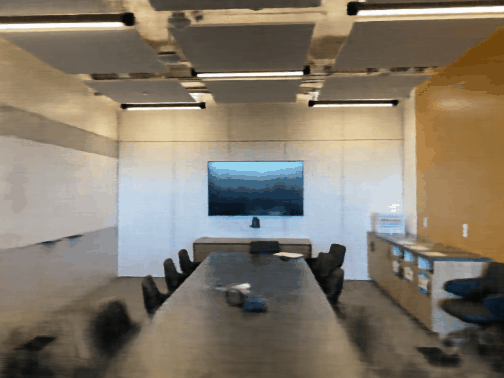

In [ ]:
from PIL import Image
im = Image.open(os.path.join('nvs_results', scene_name + 'img.gif'))
im.show()

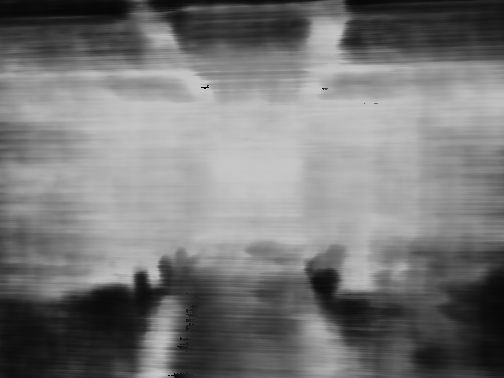

In [ ]:
im2 = Image.open(os.path.join('nvs_results', scene_name + 'depth.gif'))
im2.show()

In [ ]:
novel_depth[3][50].item()

0.750598669052124

In [ ]:
spiral_c2ws[1]

tensor([[ 9.9955e-01,  2.2669e-04,  2.9977e-02,  1.0491e-01],
        [ 0.0000e+00,  9.9997e-01, -7.5621e-03, -2.6465e-02],
        [-2.9978e-02,  7.5587e-03,  9.9952e-01, -1.9555e-03]])

## Step 6: Obtain 3D image to embed

Calculate internal characteristics of depth of the image to embed using a monocular depth estimation model.

In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 48.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 106.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 68.4 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import torch
from transformers import GLPNImageProcessor, GLPNForDepthEstimation

In [ ]:
def image_resize(image, width = None, height = None, inter = cv2.INTER_AREA):
    # initialize the dimensions of the image to be resized and
    # grab the image size
    dim = None
    (h, w) = image.shape[:2]

    # if both the width and height are None, then return the
    # original image
    if width is None and height is None:
        return image

    # check to see if the width is None
    if width is None:
        # calculate the ratio of the height and construct the
        # dimensions
        r = height / float(h)
        dim = (int(w * r), height)

    # otherwise, the height is None
    else:
        # calculate the ratio of the width and construct the
        # dimensions
        r = width / float(w)
        dim = (width, int(h * r))

    # resize the image
    resized = cv2.resize(image, dim, interpolation = inter)

    # return the resized image
    return resized

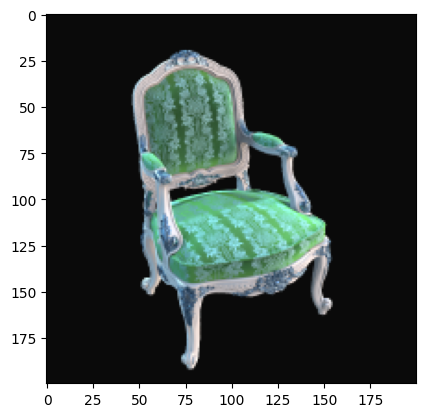

In [ ]:
# load image
imageOr = cv2.imread('r_51.png')
img = image_resize(imageOr, 200)

# convert to graky
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold input image as mask
mask = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY)[1]

# negate mask
mask = 250 - mask

# apply morphology to remove isolated extraneous noise
# use borderconstant of black since foreground touches the edges
kernel = np.ones((3,3), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# anti-alias the mask -- blur then stretch
# blur alpha channel
mask = cv2.GaussianBlur(mask, (0,0), sigmaX=2, sigmaY=2, borderType = cv2.BORDER_DEFAULT)

# linear stretch so that 127.5 goes to 0, but 255 stays 255
mask = (2*(mask.astype(np.float32))-255.0).clip(0,255).astype(np.uint8)

# put mask into alpha channel
image = img.copy()
image = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
image[:, :, 3] = mask

# save resulting masked image
cv2.imwrite('p.jpg', image)
plt.imshow(image)

In [ ]:
feature_extractor = GLPNImageProcessor.from_pretrained("vinvino02/glpn-nyu")
model = GLPNForDepthEstimation.from_pretrained("vinvino02/glpn-nyu")

# prepare image for the model
image = Image.open('p.jpg')
inputs = feature_extractor(images=image, return_tensors="pt")

# get the prediction from the model
with torch.no_grad():
    outputs = model(**inputs)
    predicted_depth = outputs.predicted_depth

output = predicted_depth.squeeze().cpu().numpy() * 1000.0

In [ ]:
import numpy as np
max = np.amax(output)
output2 = [i/(max) for i in output] #Normalized depth (PLAY WITH THIS) MENTION IN REPORT

In [ ]:
print(len(output2))
print(len(output2[0]))
print(image.size[0])
print(image.size[1])

192
192
200
200


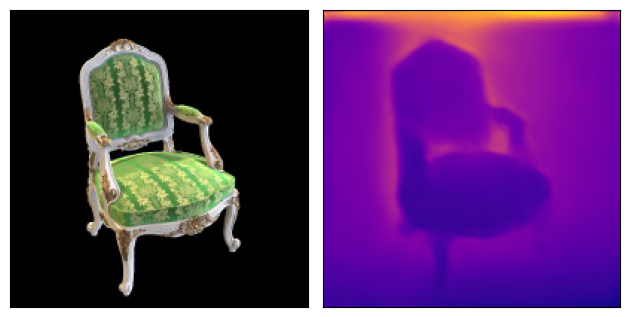

In [ ]:
# visualize the prediction
fig, ax = plt.subplots(1, 2)
ax[0].imshow(image)
ax[0].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
ax[1].imshow(output2, cmap='plasma')
ax[1].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
plt.tight_layout()
plt.pause(5)

In [ ]:
len(output)

672

In [ ]:
pix_coor = []
pix_col = []
pix_depth = []

for i in range(len(output2)):
  for j in range(len(output2[0])):
    coordinate = i, j
    color = image.getpixel(coordinate)
    if color[0] > 20 and color[1] > 20 and color[2] > 20:
      pix_coor.append(coordinate)
      pix_col.append(color)
      pix_depth.append(output2[i][j])

In [ ]:
#Check to see if depth renormalization is needed
maxim = np.amax(pix_depth)
minim = np.amin(pix_depth)
print(minim, " " , maxim)
for i in range(len(pix_depth)):
  pix_depth[i] = pix_depth[i] - minim

maxim = np.amax(pix_depth)
minim = np.amin(pix_depth)
print(minim, " " , maxim)

0.50502515   0.7173427
0.0   0.21231753


In [ ]:
pix_col

In [ ]:
for i in pix_col:
  if (i[0] == i[1] and i[1] == i[2]):
    print(i)

## Step 7: Embedding the image with the color and the depth found

In [ ]:
# Render novel views from a sprial camera trajectory.
# The spiral trajectory generation function is modified from https://github.com/kwea123/nerf_pl.
from nerfmm.utils.pose_utils import create_spiral_poses

# Render full images are time consuming, especially on colab so we render a smaller version instead.
resize_ratio = 1 #instead of 4
with torch.no_grad():
    optimised_poses = torch.stack([pose_param_net(i) for i in range(N_IMGS)])
    radii = np.percentile(np.abs(optimised_poses.cpu().numpy()[:, :3, 3]), q=50, axis=0)  # (3,)
    spiral_c2ws = create_spiral_poses(radii, focus_depth=3.5, n_poses=30, n_circle=1)
    spiral_c2ws = torch.from_numpy(spiral_c2ws).float()  # (N, 3, 4)

    # change intrinsics according to resize ratio
    fxfy = focal_net()
    novel_fxfy = fxfy / resize_ratio
    novel_H, novel_W = H // resize_ratio, W // resize_ratio

    print('NeRF trained in {0:d} x {1:d} for {2:d} epochs'.format(H, W, N_EPOCH))
    print('Rendering novel views in {0:d} x {1:d}'.format(novel_H, novel_W))

    novel_img_list, novel_depth_list = [], []
    #for i in tqdm(range(spiral_c2ws.shape[0]), desc='novel view rendering'):

    novel_img, novel_depth = render_novel_view(spiral_c2ws[0], novel_H, novel_W, novel_fxfy,
                                                 ray_params, nerf_model)

    print("NOVEL image len: ",len(novel_img), " ", len(novel_img[0]))
    print("NOVEL depth len: ",len(novel_depth), " ", len(novel_depth[0]))

    img_pos_x = 50 #Desfase en X
    img_pos_y = 160 #Desfase en Y
    depth_desired = 0.44

    for i in range(len(pix_coor)):
      pix_coor[i] = (pix_coor[i][0] + img_pos_x , pix_coor[i][1] + img_pos_y)
      t2 = pix_coor[i][0]
      t1 = pix_coor[i][1]
      #print("POS T1 y T2: ", t1 , "  ", t2)
      if ( (t1 < len(novel_img)) and (t2 < len(novel_img[0])) ):
        if ( novel_depth[t1][t2] > depth_desired  ):
          novel_depth[t1][t2] = depth_desired + pix_depth[i]
          #if (abs(pix_col[i][1] - pix_col[i][2])>1 and abs(pix_col[i][0]- pix_col[i][2])>1):
          novel_img[t1,t2][0] = pix_col[i][0]   # order 1 2 0
          novel_img[t1,t2][1] = pix_col[i][2]
          novel_img[t1,t2][2] = pix_col[i][1]

    novel_img_list.append(novel_img)
    novel_depth_list.append(novel_depth)

    print('Novel view rendering done. Saving to GIF images...')
    novel_img_list = (torch.stack(novel_img_list) * 255).cpu().numpy().astype(np.uint8)
    novel_depth_list = (torch.stack(novel_depth_list) * 200).cpu().numpy().astype(np.uint8)  # depth is always in 0 to 1 in NDC

    os.makedirs('nvs_results', exist_ok=True)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + 'img2.gif'), novel_img_list, fps=30)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + 'depth2.gif'), novel_depth_list, fps=30)
    print('GIF images saved.')

NeRF trained in 367 x 652 for 200 epochs
Rendering novel views in 367 x 652
NOVEL image len:  367   652
NOVEL depth len:  367   652
Novel view rendering done. Saving to GIF images...
GIF images saved.


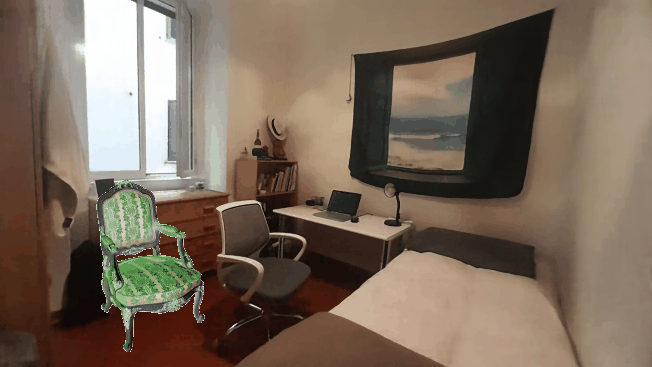

In [ ]:
im3 = Image.open(os.path.join('nvs_results', scene_name + 'img2.gif'))
im3.show()

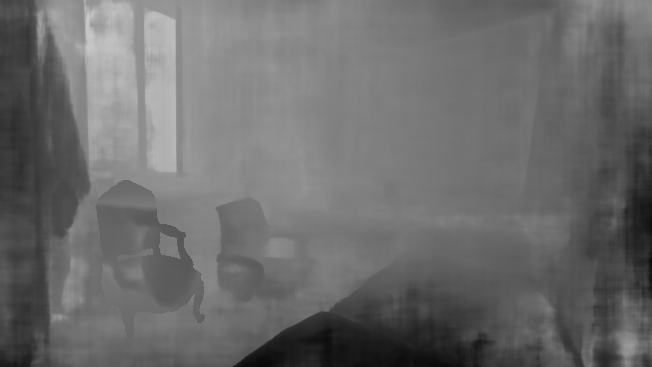

In [ ]:
im2 = Image.open(os.path.join('nvs_results', scene_name + 'depth2.gif'))
im2.show()